Revised edition of the following research papers:

1. Miller, S., & Knowles, J. (2015). __*Population fluctuation promotes cooperation in networks*__. Scientific Reports, 5(1), 11054. https://doi.org/10.1038/srep11054
2. Poncela, J., Gómez-Gardenes, J., Floría, L. M., Sánchez, A., & Moreno, Y. (2008). __*Complex cooperative networks from evolutionary preferential attachment*__. PLoS one, 3(6), e2449. https://doi.org/10.1371/journal.pone.0002449

- Add environmental fluctuation

# 1. The model

In [50]:
using Dates
using Graphs
using Random: MersenneTwister, shuffle
using StatsBase: mean, sample, Weights, countmap
using Plots: Plot, plot, plot!, histogram, twinx

using Test: @testset, @test

Threads.nthreads()

12

In [51]:
@enum Strategy C D

@kwdef struct Param
    N_init::Int = 3            # initial population
    N_max::Int = 1_000         # capsize of population
    C_rate_init::Float64 = 0.0 # initial cooperator(C)'s freqtrialscy
    b::Float64 = 4.0           # benefit to defect
    n::Int = 10                # added node count
    m::Int = 2                 # added edge count
    ϵ::Float64 = 0.99          # selection pressure
    X::Float64 = 0.0           # truncation rate
    fitness_based_truncation::Bool = true
    generations::Int = 2_000   # time steps
    trials::Int = 25           # trial count
end

mutable struct Model
    p::Param
    payoff_table::Dict

    # agent's parameters
    strategy_vec::Vector{Strategy}     # agents' strategy
    payoff_vec::Vector{Float64}        # agents' payoff
    g::SimpleGraph
    rng::MersenneTwister

    function Model(p::Param)
        S = -0.1
        payoff_table = Dict((C, C) => (1.0, 1.0), (C, D) => (S, p.b), (D, C) => (p.b, S), (D, D) => (0.0, 0.0))

        strategy_vec = if p.C_rate_init == 0.0
            fill(D, p.N_init)
        elseif p.C_rate_init == 1.0
            fill(C, p.N_init)
        else
            [p.C_rate_init > rand(m.rng) ? C : D for _ in 1:p.N_init]
        end

        payoff_vec = fill(0.0, p.N_init)

        g = complete_graph(p.N_init)
        
        return new(p, payoff_table, strategy_vec, payoff_vec, g, MersenneTwister())
    end
end;

## 1.1. Play prisoner’s dilemma

In [52]:
function play_prisoners_dilemma!(m::Model)::Nothing
    N = nv(m.g)
    m.payoff_vec .= 0.0

    for focal_id in 1:N, opponent_id in neighbors(m.g, focal_id)
        if focal_id < opponent_id
            (focal_strategy, opponent_strategy) = m.strategy_vec[[focal_id, opponent_id]]
            (focal_payoff, opponent_payoff) = m.payoff_table[(focal_strategy, opponent_strategy)]
            m.payoff_vec[focal_id] += focal_payoff
            m.payoff_vec[opponent_id] += opponent_payoff
        end
    end
    
    return
end

@testset "play_prisoners_dilemma!" begin
    # pre-condiction
    p = Param(N_init = 5)
    m = Model(p)
    m.strategy_vec = [C, C, D, D, D]
    rem_edge!(m.g, 2, 3)

    # execute
    play_prisoners_dilemma!(m)

    @test m.payoff_vec == [1.0, 1.0, 4.0, 8.0, 8.0]
end;

play_prisoners_dilemma!: Test Failed at In[52]:27
  Expression: m.payoff_vec == [1.0, 1.0, 4.0, 8.0, 8.0]
   Evaluated: [0.7000000000000001, 0.8, 4.0, 8.0, 8.0] == [1.0, 1.0, 4.0, 8.0, 8.0]

Stacktrace:
 [1] macro expansion
   @ ~/.julia/juliaup/julia-1.10.2+0.aarch64.apple.darwin14/share/julia/stdlib/v1.10/Test/src/Test.jl:672 [inlined]
 [2] macro expansion
   @ In[52]:27 [inlined]
 [3] macro expansion
   @ ~/.julia/juliaup/julia-1.10.2+0.aarch64.apple.darwin14/share/julia/stdlib/v1.10/Test/src/Test.jl:1577 [inlined]
 [4] top-level scope
   @ In[52]:19
Test Summary:           | Fail  Total  Time
play_prisoners_dilemma! |    1      1  0.1s


LoadError: [91mSome tests did not pass: 0 passed, 1 failed, 0 errored, 0 broken.[39m

## 1.2. Update strategies

In [73]:
function update_strategies!(m::Model)::Nothing
    N = nv(m.g)
    b = max(1.0, m.p.b)

    for focal_id in 1:N
        opponent_id_vec = neighbors(m.g, focal_id)
        length(opponent_id_vec) == 0 && continue

        opponent_id = rand(m.rng, opponent_id_vec)
        (focal_payoff, opponent_payoff) = m.payoff_vec[[focal_id, opponent_id]]
        focal_payoff >= opponent_payoff && continue

        k = max(degree(m.g, focal_id), degree(m.g, opponent_id))
        pᵢ = (opponent_payoff - focal_payoff) / (b * k)
        @assert 0 <= pᵢ <= 1.1 "pᵢ = $(pᵢ)"
        pᵢ < rand(m.rng) && continue

        m.strategy_vec[focal_id] = m.strategy_vec[opponent_id]
    end
    
    return
end

@testset "update_strategies!" begin
    # pre-condiction
    p = Param(N_init = 5)
    m = Model(p)
    m.payoff_vec = [0.0, 16.0, 0.3, 0.5, 0.4]
    m.strategy_vec = [C, D, C, D, C]
    m.rng = MersenneTwister(2)

    # execute
    update_strategies!(m)
    @test m.strategy_vec == [D, D, C, D, C]
    update_strategies!(m)
    @test m.strategy_vec == [D, D, D, D, C]
end;

Test Summary:      | Pass  Total  Time
update_strategies! |    2      2  0.0s


In [54]:
freq_C(m::Model)::Float64 = sum(m.strategy_vec .== C) / length(m.strategy_vec)

@testset "freq_C" begin
    m = Model(Param())
    m.strategy_vec = [C, C, C]
    @test freq_C(m) ≈ 1
    m.strategy_vec = [C, C, D]
    @test freq_C(m) ≈ 0.66666667
    m.strategy_vec = [C, D, D]
    @test freq_C(m) ≈ 0.33333333
    m.strategy_vec = [D, D, D]
    @test freq_C(m) ≈ 0
end;

Test Summary: | Pass  Total  Time
freq_C        |    4      4  0.0s


### Example

Confirm that `play_prisoners_dilemma!` and `update_strategies!` promote cooperation on a scale-free network (BA model).

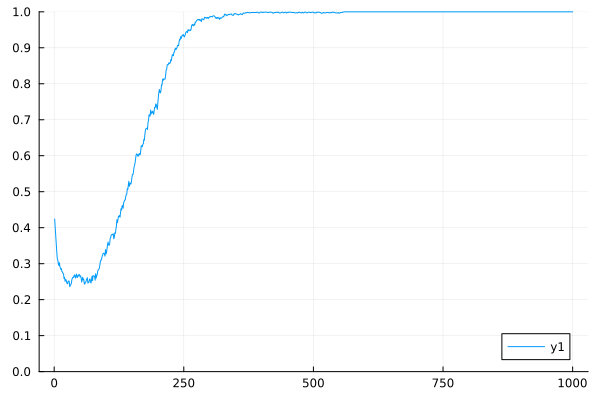

In [55]:
N = 1000
k = 4
generations = 1000

p = Param(b = 1.3)
m = Model(p)
m.g = barabasi_albert(N, k)
m.strategy_vec = rand([C, D], N)
m.payoff_vec = fill(0.0, N)
freq_C_vec = fill(0.0, generations)

for generation in 1:generations
    play_prisoners_dilemma!(m)
    update_strategies!(m)
    freq_C_vec[generation] = freq_C(m)
end

plot(freq_C_vec, ylim = (0, 1), yticks = 0:0.1:1)

## 1.3. Grow network

### Adjust strength of selection

Test Summary:             | Pass  Total  Time
adjust_selection_pressure |    3      3  0.0s


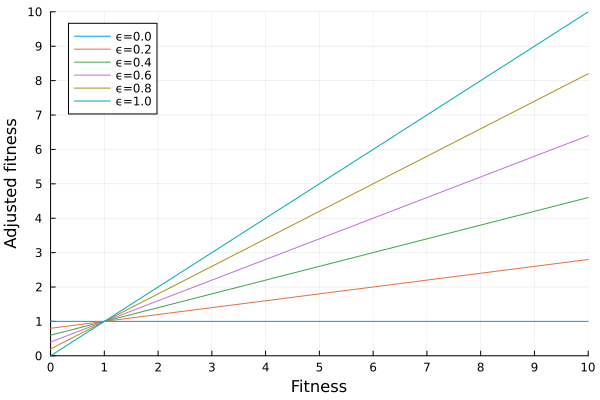

In [56]:
adjust_selection_pressure(f::Float64, ϵ::Float64)::Float64 = 1 - ϵ + ϵ * f

@testset "adjust_selection_pressure" begin
    @test adjust_selection_pressure(0.5, 1.0) ≈ 0.5
    @test adjust_selection_pressure(0.5, 0.5) ≈ 0.75
    @test adjust_selection_pressure(0.5, 0.0) ≈ 1.0
end

# Examples
fitness_vec = 0:0.1:10
ϵ_vec = 0:0.2:1
p = plot(xtick = 0:10, ytick = 0:10, xlim = (0, 10), ylim = (0, 10), xlabel = "Fitness", ylabel = "Adjusted fitness")
for ϵ in ϵ_vec
    plot!(fitness_vec, adjust_selection_pressure.(fitness_vec, Ref(ϵ)), label = "ϵ=$(ϵ)")
end
p

### Check stochastic function

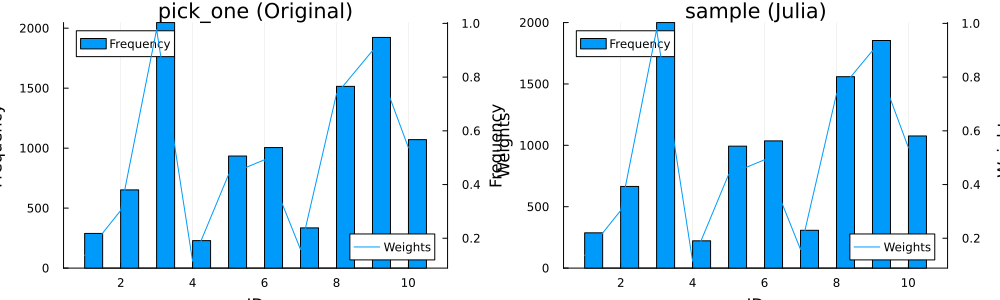

Test Summary: |Time
pick_one      | None  1.1s


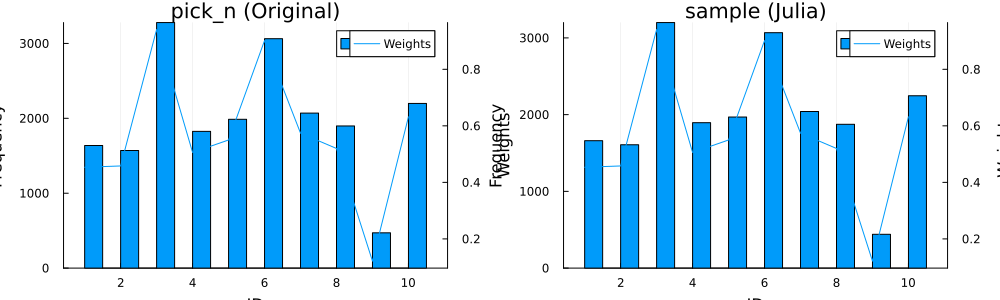

Test Summary: |Time
pick_n        | None  0.4s


In [57]:
function pick_one(rng::MersenneTwister, id_vec::Vector{Int}, weights::Vector{Float64}, assertion = true)::Int
    if assertion
        @assert length(id_vec) == length(weights) "$(length(id_vec)), $(length(weights))"
        @assert all(weights .>= 0) "All weights should be > 0."
    end
    
    weights_stack = 0
    target = rand(rng) * sum(weights)
    
    for (id, weight) in zip(id_vec, weights)
        weights_stack += weight
        
        if target < weights_stack
            return id
        end
    end
end

function pick_n(rng::MersenneTwister, id_vec::Vector{Int}, weights::Vector{Float64}, n::Int, assertion = true)::Vector{Int}
    result_vec = []

    for _ in 1:n
        index_vec = findall(∉(result_vec), id_vec)
        append!(result_vec, pick_one(rng, id_vec[index_vec], weights[index_vec], assertion))
    end
    
    if assertion
        @assert length(result_vec) == length(unique(result_vec)) "Return vector should be unique."
    end
    
    return result_vec
end

@testset "pick_one" begin
    rng = MersenneTwister(Millisecond(now()).value)

    N = 10
    id_vec = vec(collect(1:N))
    weights = rand(rng, N)

    result_vec = [pick_one(rng, id_vec, weights) for _ in 1:10000]
    p1 = histogram(result_vec, label="Frequency", xlabel="ID", ylabel="Frequency", title="pick_one (Original)")
    plot!(twinx(), weights, label="Weights", ylabel="Weights")

    result_vec = [sample(rng, id_vec, Weights(weights)) for _ in 1:10000]
    p2 = histogram(result_vec, label="Frequency", xlabel="ID", ylabel="Frequency", title="sample (Julia)")
    plot!(twinx(), weights, label="Weights", ylabel="Weights")

    plot(p1, p2, size = (1000, 300)) |> display
end

@testset "pick_n" begin
    rng = MersenneTwister(Millisecond(now()).value)

    N = 10
    id_vec = vec(collect(1:N))
    weights = rand(rng, N)

    result_vec = [pick_n(rng, id_vec, weights, 2) for _ in 1:10000]
    result_vec = reduce(vcat, result_vec)
    p1 = histogram(result_vec, label="Frequency", xlabel="ID", ylabel="Frequency", title="pick_n (Original)")
    plot!(twinx(), weights, label="Weights", ylabel="Weights")
    
    result_vec = [sample(rng, id_vec, Weights(weights), 2, replace = false) for _ in 1:10000]
    result_vec = reduce(vcat, result_vec)
    p2 = histogram(result_vec, label="Frequency", xlabel="ID", ylabel="Frequency", title="sample (Julia)")
    plot!(twinx(), weights, label="Weights", ylabel="Weights")

    plot(p1, p2, size = (1000, 300)) |> display
end;

In [65]:
function grow_network!(m::Model)::Nothing
    N = nv(m.g)
    N >= m.p.N_max && return
    
    # add nodes
    add_count = N + m.p.n > m.p.N_max ? (m.p.N_max - N) : m.p.n
    add_vertices!(m.g, add_count)
    append!(m.payoff_vec, zeros(add_count))
    append!(m.strategy_vec, rand(m.rng, [C, D], add_count))
    N = nv(m.g)

    # calc adjusted fitness
    fitness_vec = adjust_selection_pressure.(m.payoff_vec, Ref(m.p.ϵ))

    # add edges
    for i in (N - m.p.n + 1):N
        candidate_id_vec = filter(!=(i), 1:N)
        # for target_id in pick_n(m.rng, candidate_id_vec, fitness_vec[candidate_id_vec], m.p.m, true)
        for target_id in pick_n(m.rng, candidate_id_vec, Float64.(degree(m.g))[candidate_id_vec], m.p.m, true)
            add_edge!(m.g, i, target_id)
        end
    end

    return
end

@testset "grow_network!" begin
    # pre-condiction
    p = Param()
    m = Model(p)
    m.payoff_vec = [1.0, 5.0, 25.0]
    m.rng = MersenneTwister(1)

    # execute
    grow_network!(m)

    @test degree(m.g) == [4, 9, 12, 2, 2, 3, 2, 2, 2, 2, 2, 2, 2]
end;

grow_network!: Test Failed at In[65]:37
  Expression: degree(m.g) == [4, 9, 12, 2, 2, 3, 2, 2, 2, 2, 2, 2, 2]
   Evaluated: [3, 11, 8, 3, 3, 4, 2, 2, 2, 2, 2, 2, 2] == [4, 9, 12, 2, 2, 3, 2, 2, 2, 2, 2, 2, 2]

Stacktrace:
 [1] macro expansion
   @ ~/.julia/juliaup/julia-1.10.2+0.aarch64.apple.darwin14/share/julia/stdlib/v1.10/Test/src/Test.jl:672 [inlined]
 [2] macro expansion
   @ In[65]:37 [inlined]
 [3] macro expansion
   @ ~/.julia/juliaup/julia-1.10.2+0.aarch64.apple.darwin14/share/julia/stdlib/v1.10/Test/src/Test.jl:1577 [inlined]
 [4] top-level scope
   @ In[65]:29
Test Summary: | Fail  Total  Time
grow_network! |    1      1  0.0s


LoadError: [91mSome tests did not pass: 0 passed, 1 failed, 0 errored, 0 broken.[39m

## 1.4. Truncate network

In [66]:
function truncate_network!(m::Model)::Nothing
    N = nv(m.g)
    N < m.p.N_max && return
    
    truncate_count = round(Int, N * m.p.X)
    # sorted_indices = m.p.fitness_based_truncation ? sortperm(m.payoff_vec) : shuffle(1:N)
    sorted_indices = m.p.fitness_based_truncation ? sortperm(degree(m.g)) : shuffle(1:N)
    survived_node_id = sort(sorted_indices[(truncate_count + 1):end])

    m.strategy_vec = m.strategy_vec[survived_node_id]
    m.payoff_vec = m.payoff_vec[survived_node_id]
    m.g = SimpleGraph(adjacency_matrix(m.g)[survived_node_id, survived_node_id])

    return
end

@testset "truncate_network!" begin
    # pre-condiction
    p = Param(N_max = 50, X = 0.25)
    m = Model(p)
    m.payoff_vec = [1.0, 5.0, 25.0]
    m.rng = MersenneTwister(1)
    
    N = p.N_max + 1
    m.payoff_vec = shuffle(m.rng, vec(collect(1:N)))
    m.strategy_vec = repeat([C, C, C, D, D, D], 9)[1:N]
    m.g = barabasi_albert(N, 4, seed=1)

    survived_node_id = sort(sortperm(m.payoff_vec)[14:N])
    expected_payoff_vec = m.payoff_vec[survived_node_id]
    expected_strategy_vec = m.strategy_vec[survived_node_id]
    @assert length(m.strategy_vec) == length(m.payoff_vec) == nv(m.g) == N == 51

    # execute
    truncate_network!(m)
    @test length(m.strategy_vec) == length(m.payoff_vec) == nv(m.g) == 38
    @test sort(m.payoff_vec) == collect(14:N)
    @test m.payoff_vec == expected_payoff_vec
    @test m.strategy_vec == expected_strategy_vec
    @test degree(m.g) == [6, 2, 6, 1, 8, 4, 5, 12, 5, 6, 8, 4, 5, 11, 7, 6, 3, 5, 3, 4, 8, 4, 3, 5, 6, 4, 3, 2, 6, 1, 3, 4, 2, 3, 3, 2, 2, 4]
end;

truncate_network!: Test Failed at In[66]:37
  Expression: sort(m.payoff_vec) == collect(14:N)
   Evaluated: [1.0, 3.0, 4.0, 5.0, 6.0, 9.0, 10.0, 12.0, 13.0, 14.0  …  38.0, 39.0, 40.0, 41.0, 43.0, 45.0, 46.0, 47.0, 48.0, 49.0] == [14, 15, 16, 17, 18, 19, 20, 21, 22, 23  …  42, 43, 44, 45, 46, 47, 48, 49, 50, 51]

Stacktrace:
 [1] macro expansion
   @ ~/.julia/juliaup/julia-1.10.2+0.aarch64.apple.darwin14/share/julia/stdlib/v1.10/Test/src/Test.jl:672 [inlined]
 [2] macro expansion
   @ In[66]:37 [inlined]
 [3] macro expansion
   @ ~/.julia/juliaup/julia-1.10.2+0.aarch64.apple.darwin14/share/julia/stdlib/v1.10/Test/src/Test.jl:1577 [inlined]
 [4] top-level scope
   @ In[66]:19
truncate_network!: Test Failed at In[66]:38
  Expression: m.payoff_vec == expected_payoff_vec
   Evaluated: [39.0, 30.0, 5.0, 1.0, 48.0, 9.0, 20.0, 22.0, 31.0, 34.0  …  10.0, 4.0, 12.0, 27.0, 14.0, 17.0, 29.0, 40.0, 3.0, 47.0] == [39.0, 23.0, 30.0, 25.0, 48.0, 20.0, 22.0, 31.0, 34.0, 45.0  …  14.0, 44.0, 17.0, 37.0,

LoadError: [91mSome tests did not pass: 1 passed, 4 failed, 0 errored, 0 broken.[39m

# 2. Run simulation

In [67]:
function run_one_generation!(m::Model)::Nothing
    play_prisoners_dilemma!(m)
    update_strategies!(m)
    grow_network!(m)
    truncate_network!(m)
end

function run!(p::Param; pre_existing_network::Bool = false)::Tuple{Matrix, Vector}
    log_freq_C_mat = fill(0.0, p.trials, p.generations)
    log_degree_vec = fill([0.0], p.trials)

    for trial in 1:p.trials
        m = Model(p)
        
        if pre_existing_network
            @assert p.N_init == p.N_max
            m.g = erdos_renyi(p.N_init, p.N_init * p.m)
        end

        for generation in 1:p.generations
            run_one_generation!(m)
            log_freq_C_mat[trial, generation] = freq_C(m)
        end
        
        log_degree_vec[trial] = degree(m.g)
    end
    
    return log_freq_C_mat, log_degree_vec
end;

In [74]:
# Parameters
generations = 2_000
# trials = 25
trials = 10
C_rate_init_vec = [1.0, 0.0]
b_vec = 1:0.3:3.1
X_vec = [0, 0.025, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5]
fitness_based_truncation_vec = [true, false]
params = [(C_rate_init, b, X, fitness_based_truncation)
    for C_rate_init in C_rate_init_vec, b in b_vec, X in X_vec, fitness_based_truncation in fitness_based_truncation_vec]
println(repeat(".", length(params)))

# log container
log1_freq_C_dict = Dict(key => fill(0.0, 1, 1) for key in params)
log1_degree_dict = Dict(key => fill([0.0], 1) for key in params)

# generations = 2_000, trials = 25 =>
# 4544.570639 seconds (838.35 G allocations: 21.529 TiB, 33.20% gc time, 0.02% compilation time)
# 4303.627869 seconds (495.00 G allocations: 21.409 TiB, 29.95% gc time, 0.01% compilation time)
@time Threads.@threads for (C_rate_init, b, X, fitness_based_truncation) in params
    p = Param(C_rate_init = C_rate_init, b = b, X = X, fitness_based_truncation = fitness_based_truncation, generations = generations, trials = trials)
    log_freq_C_mat, log_degree_vec = run!(p)
    log1_freq_C_dict[C_rate_init, b, X, fitness_based_truncation] = log_freq_C_mat
    log1_degree_dict[C_rate_init, b, X, fitness_based_truncation] = log_degree_vec
    print(".")
end

................................................................................................................................................................................................................................................................
................................................................................................................................................................................................................................................................1733.962057 seconds (196.75 G allocations: 9.211 TiB, 28.82% gc time, 0.02% compilation time)


# 3. Visualization

## 3.1. Results for networks grown from founder populations

In [69]:
function plot_fraction_b(log_freq_C_dict::Dict; fitness_based_truncation::Bool, C_rate_init::Float64)::Plot
    title = "Populatin grown from $(C_rate_init == 1.0 ? "C" : "D") founders" * "\n" * (fitness_based_truncation ? "(Fitness based trancation)" : "(Random trancation)")
    p = plot(xl = "b", xlim = (1, 3.1), yl = "Fraction of cooperators", ylim = (0, 1), title = title)

    for X in X_vec
        fig_vec = [(_b, mean(_value[:, (end - 100):end])) for ((_Cri, _b, _X, _fbt), _value) in log_freq_C_dict if _Cri == C_rate_init && _fbt == fitness_based_truncation && _X == X]
        fig_vec = sort(fig_vec, by = (x -> x[1]))
        fig_vec = map(x -> x[2], fig_vec)
        plot!(b_vec, fig_vec, label = "$(X * 100)%")
    end

    return p
end;

### Fig 1. Effect of truncation size on cooperation.

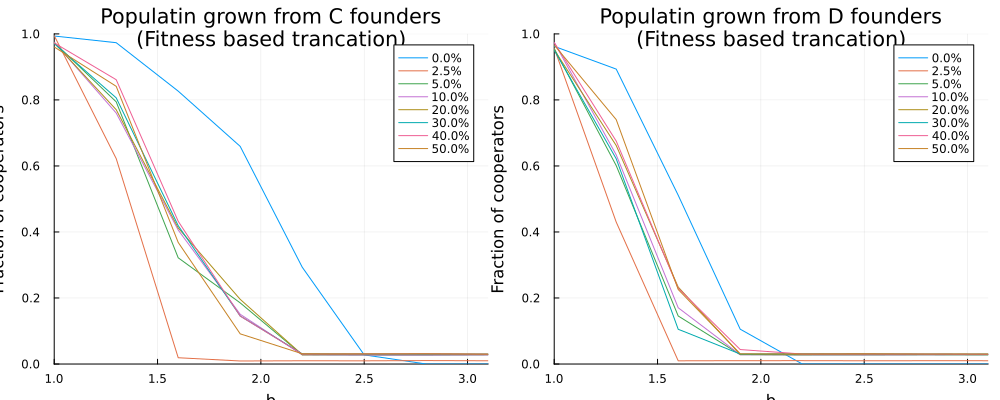

In [75]:
plot(
    plot_fraction_b(log1_freq_C_dict, fitness_based_truncation = true, C_rate_init = 1.0),
    plot_fraction_b(log1_freq_C_dict, fitness_based_truncation = true, C_rate_init = 0.0),
    size = (1000, 400),
    layout = (1, 2)
)

### Fig 2. Effect of random rather than weighted selection of nodes for network truncation.

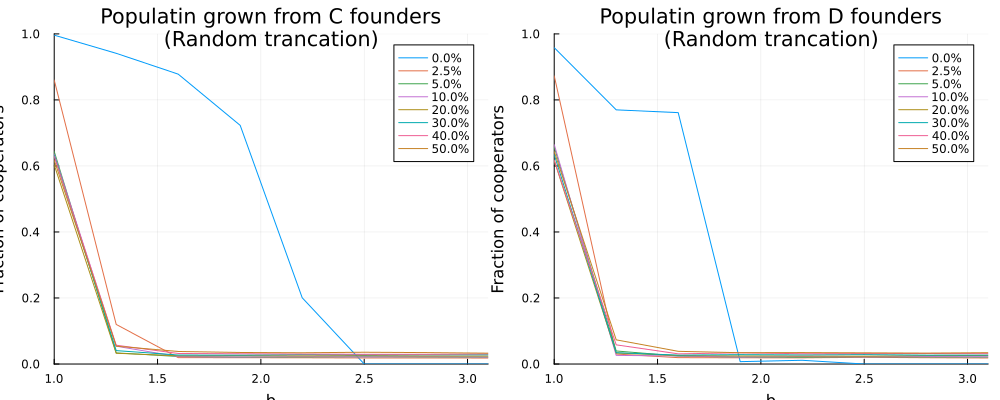

In [76]:
plot(
    plot_fraction_b(log1_freq_C_dict, fitness_based_truncation = false, C_rate_init = 1.0),
    plot_fraction_b(log1_freq_C_dict, fitness_based_truncation = false, C_rate_init = 0.0),
    size = (1000, 400),
    layout = (1, 2)
)

### Fig 3. Example simulation plots for EPA and fluctuation models starting from cooperator founders.

In [16]:
function plot_fraction_generation(log_freq_C_dict::Dict; fitness_based_truncation::Bool = true, C_rate_init::Float64 = 1.0, b = 2.2)::Plot
    freq_C_EPA = log_freq_C_dict[(C_rate_init, b, 0.0, fitness_based_truncation)]
    freq_C_frq = log_freq_C_dict[(C_rate_init, b, 0.025, fitness_based_truncation)]

    xl = "generation"
    yl = "Fraction of cooperators"
    xlim = (0, 2_000)
    ylim = (0, 1)

    return plot(
        plot(transpose(freq_C_EPA), xl = xl, xlim = xlim, yl = yl, ylim = ylim, title = "EPA model", label = false),
        plot(transpose(freq_C_frq), xl = xl, xlim = xlim, yl = yl, ylim = ylim, title = "Fluctuation model", label = false),
        layout = (1, 2),
        size = (1000, 400)
    )
end;

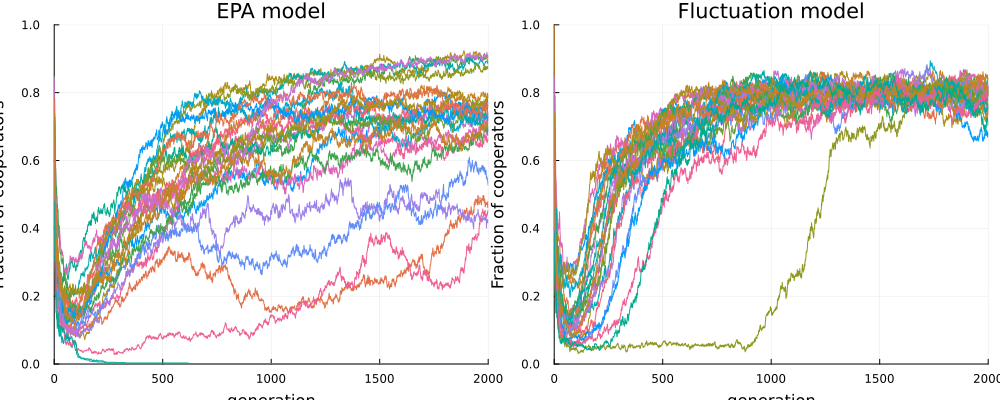

In [17]:
plot_fraction_generation(log1_freq_C_dict)

### Fig 4. Example simulation plots for EPA and fluctuation models starting from defector founders.

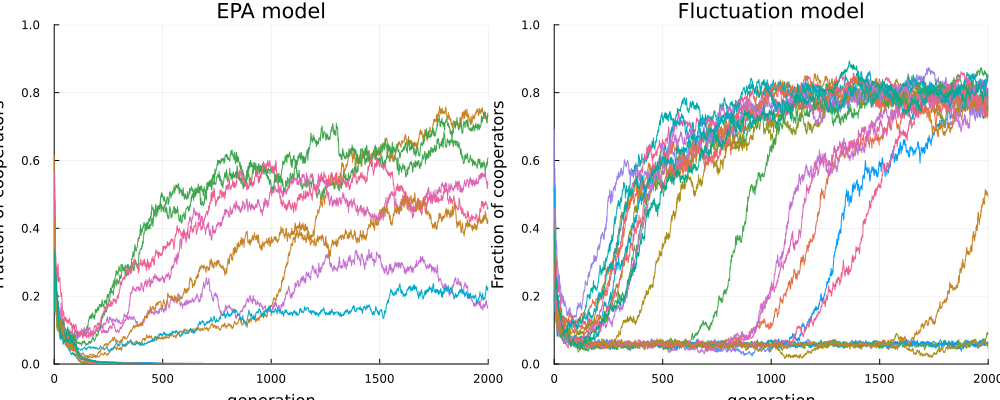

In [18]:
plot_fraction_generation(log1_freq_C_dict, C_rate_init = 0.0)

### Fig 5 (b), Fig 6 (b)

In [19]:
function plot_degree_distribution(log_degrees_vec::Vector; title::String = "Degree distribution")::Plot
    p = plot(xscale=:log10, yscale=:log10, xlim=(1, 10^3), ylim=(1, 10^3), xlabel="Degree", ylabel="Frequency", title=title, legend=false)

    for degrees in log_degrees_vec
        degree_count = sort(Dict(k => v for (k, v) in countmap(degrees) if k > 0))
        xs = collect(keys(degree_count))
        ys = [degree_count[x] for x in xs]
        plot!(xs, ys)
    end
    
    return p
end;

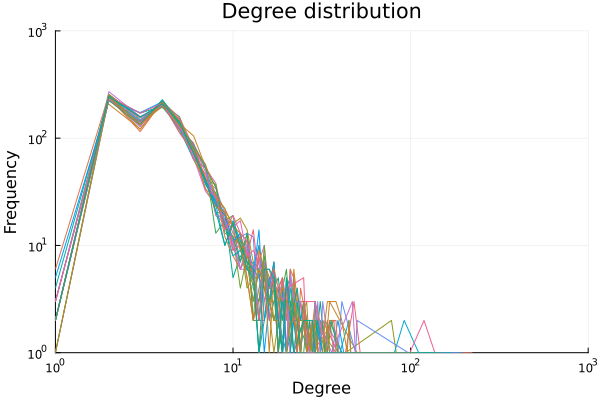

In [20]:
plot_degree_distribution(log1_degree_dict[(1.0, 2.2, 0.025, true)])

## 3.2. Results for pre-existing random networks

In [21]:
N = 1_000
X = 0.025
fitness_based_truncation = true
generations = 20_000
trials = 25

b_vec = 1.3:0.3:3.1
C_rate_init_vec = [0.0, 0.5, 1.0]

params = [(b, C_rate_init) for b in b_vec, C_rate_init in C_rate_init_vec]
println(repeat(".", length(params)))

# log container
log2_freq_C_dict = Dict(key => fill(0.0, 1, 1) for key in params)
log2_degree_dict = Dict(key => fill([0.0], 1) for key in params)

# generations = 2_000, trials = 25 => 4544.570639 seconds (838.35 G allocations: 21.529 TiB, 33.20% gc time, 0.02% compilation time)
@time Threads.@threads for (b, C_rate_init) in params
    p = Param(N_init = N, N_max = N, C_rate_init = C_rate_init, b = b, X = X, generations = generations, trials = trials)
    log_freq_C_mat, log_degree_vec = run!(p, pre_existing_network = true)
    log2_freq_C_dict[(b, C_rate_init)] = log_freq_C_mat
    log2_degree_dict[(b, C_rate_init)] = log_degree_vec
    print(".")
end

.....................
.....................5254.387380 seconds (704.86 G allocations: 27.864 TiB, 38.56% gc time, 0.01% compilation time)


In [22]:
function plot_fraction_b_fig7(log_freq_C_dict)::Plot
    title = "Effect on fluctuation on pre-existing networks"
    p = plot(xl = "b", xlim = (1, 3.1), yl = "Fraction of cooperators", ylim = (0, 1), title = title)

    for C_rate_init in C_rate_init_vec
        fig_vec = [(_b, mean(_value[:, round(Int, end * 0.9):end])) for ((_b, _Cri), _value) in log2_freq_C_dict if _Cri == C_rate_init]
        fig_vec = sort(fig_vec, by = (x -> x[1]))
        fig_vec = map(x -> x[2], fig_vec)
        plot!(b_vec, fig_vec, label = "$(C_rate_init * 100)%")
    end

    return p
end;

### Fig 7

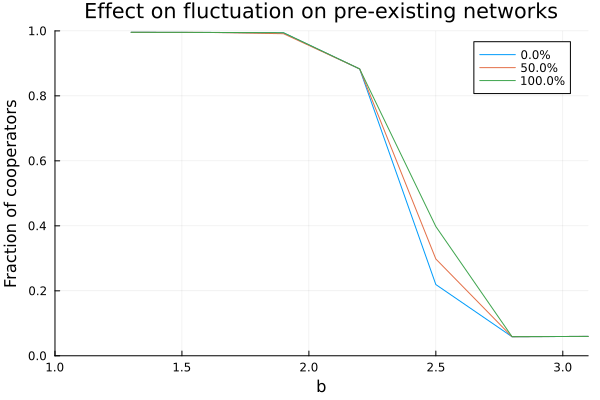

In [23]:
plot_fraction_b_fig7(log2_freq_C_dict)

### Fixed network as a baseline

In [24]:
generations = 3_000
C_rate_init = 0.5
trials = 10
b_vec = collect(1.3:0.3:2.5)
freq_C_mat = fill(0.0, length(b_vec), trials)

for trial in 1:trials
    for b_index in 1:length(b_vec)
        p = Param(N_init = N, N_max = N, b = b_vec[b_index], C_rate_init = C_rate_init)
        m = Model(p)
        m.g = erdos_renyi(p.N_init, p.N_init * p.m)
        freq_C_vec = fill(0.0, generations)

        for generation in 1:generations
            play_prisoners_dilemma!(m)
            update_strategies!(m)
            freq_C_vec[generation] = freq_C(m)
        end
        
        freq_C_mat[b_index, trial] = mean(freq_C_vec[(generations - 200):generations])
    end
end;

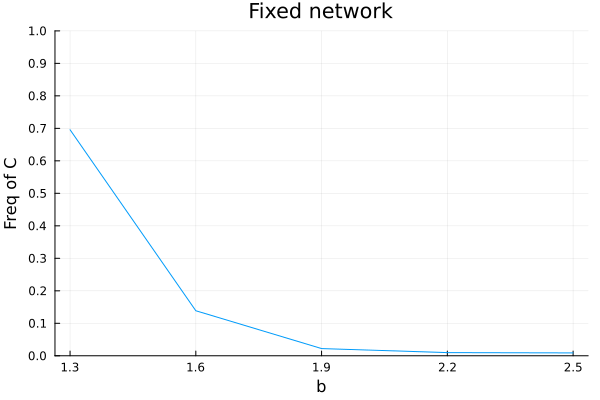

In [25]:
plot(
    b_vec,
    mean(freq_C_mat, dims=2),
    xtick = b_vec,
    xlabel = "b",
    ylim = (0, 1),
    ytick = 0:0.1:1,
    ylabel = "Freq of C",
    label = false,
    title = "Fixed network"
)

### Fig 8

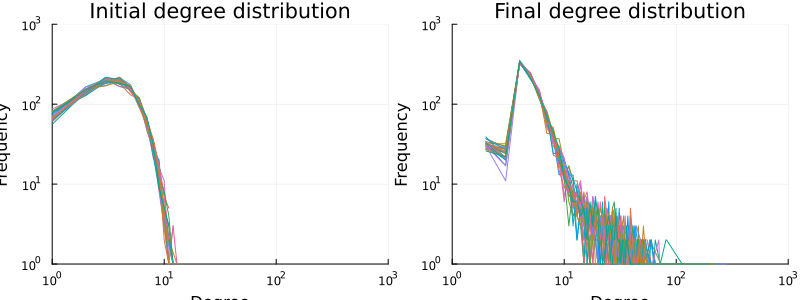

In [26]:
# initial status
p = Param(N_init = N, N_max = N)
g_vec = [erdos_renyi(p.N_init, p.N_init * p.m) for _ in 1:p.trials]
p_init = plot_degree_distribution(degree.(g_vec); title = "Initial degree distribution")

# end status
p_end = plot_degree_distribution(log2_degree_dict[(2.2, 0.0)]; title = "Final degree distribution")

plot(p_init, p_end, size = (800, 300))